Copyright 2021 Abbrivia GmbH https://www.abbrivia.com CC-BY (By Attribution) 4.0 https://creativecommons.org/licenses/by/4.0/legalcode
Reuse our work freely

All visualizations, and code produced in this notebook are completely open access under the Creative Commons BY license. You have the permission to use, distribute, and reproduce these in any medium, provided the source and authors are credited.

The data produced by third parties and made available by "Our World in Data" is subject to the license terms from the original third-party authors. Check the license of any third-party data before use and redistribution on 'https://ourworldindata.org/coronavirus' site (see below).

# This notebook provides a transparent visualization and statistics of the Coronavirus (COVID-19) Vaccinations and Excess Mortality Dataset OWID
It is split into essentially two large parts
1. [Correlation over time between vaccinations and excessive mortality](#Correlation-over-time-between-vaccinations-and-excessive-mortality)
2. [Cumulative Excess Mortality vs Latest Vaccination Levels](Cumulative-Excess-Mortality-vs-Latest-Vaccination-Levels)

# Getting the Data

See the defintions and further discussion on the used dataset at the "Our World in Data" site  https://ourworldindata.org/covid-vaccinations

The data is taken specifically from https://covid.ourworldindata.org/data/owid-covid-data.xlsx file

Hannah Ritchie, Edouard Mathieu, Lucas Rodés-Guirao, Cameron Appel, Charlie Giattino, Esteban Ortiz-Ospina, Joe Hasell, Bobbie Macdonald, Diana Beltekian and Max Roser (2020) - "Coronavirus Pandemic (COVID-19)". Published online at OurWorldInData.org. Retrieved from: 'https://ourworldindata.org/coronavirus' [Online Resource]

We use Excel file because it contains the data format information in itself. If you want to run this more often consider manually downloading the data and sourcing it locally as shown in the next line (commented out).

In [40]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from sklearn import linear_model
from scipy.signal import find_peaks

In [2]:
d=pd.read_excel('https://covid.ourworldindata.org/data/owid-covid-data.xlsx')

In [3]:
#d=pd.read_excel('owid-covid-data.xlsx')

# Let's see what is in the dataset

In [44]:
d.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

In [85]:
d[['excess_mortality','total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',]].describe()

,excess_mortality,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred
count,5206.000000,38415.000000,36904.000000,34115.000000,11845.000000
mean,16.132134,60.581406,33.554704,27.507576,5.161685
std,31.168332,55.833897,27.492301,25.778268,9.829468
min,-95.920000,0.000000,0.000000,0.000000,0.000000
25%,-0.620000,8.790000,6.380000,3.510000,0.000000
50%,7.135000,45.240000,29.385000,19.650000,0.280000
75%,22.620000,105.435000,58.470000,49.600000,5.350000
max,374.200000,321.520000,122.210000,118.920000,80.390000


# Correlation over time between vaccinations and excessive mortality
We use pandas.DataFrame.corr to compute pairwise correlation of columns, **excluding NA/null values**.

https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html

https://www.iban.com/country-codes

In [86]:
for metric in ['total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',]:
    print(metric ,'and excess_mortality')
    print('Correlation coefficient = {:.2f}'.format(d[['excess_mortality', metric]].corr().unstack()[1]))
    reg = linear_model.LinearRegression()
    dfr=d[ (~d['excess_mortality'].isnull()) & (~d[metric].isnull())]
    X = dfr[[metric,]].fillna(dfr.mean()).values
    y = dfr['excess_mortality'].values
    model = reg.fit(X,y)
    print('Linear model coefficient = {:.2f}'.format(model.coef_[0]))
    print("R^2 ={: 1.0f}%".format(100*reg.score(X, y)))
del dfr    

total_vaccinations_per_hundred and excess_mortality
Correlation coefficient = -0.19
Linear model coefficient = -0.12
R^2 = 4%
people_vaccinated_per_hundred and excess_mortality
Correlation coefficient = -0.20
Linear model coefficient = -0.25
R^2 = 4%
people_fully_vaccinated_per_hundred and excess_mortality
Correlation coefficient = -0.16
Linear model coefficient = -0.21
R^2 = 3%
total_boosters_per_hundred and excess_mortality
Correlation coefficient = 0.06
Linear model coefficient = 0.22
R^2 = 0%


## De-averaging of the correlation over time by countries

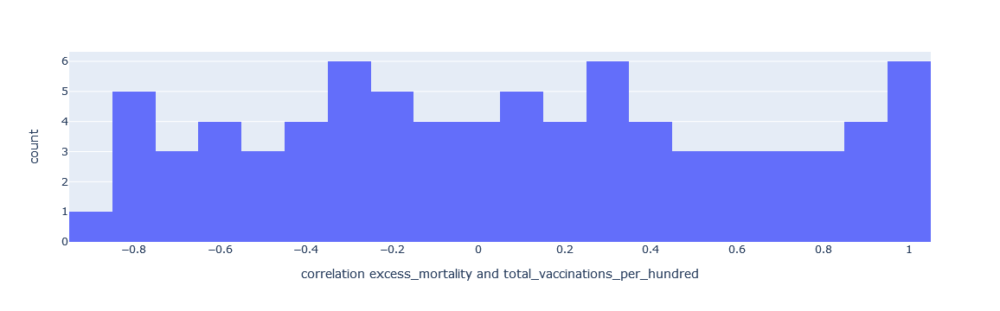

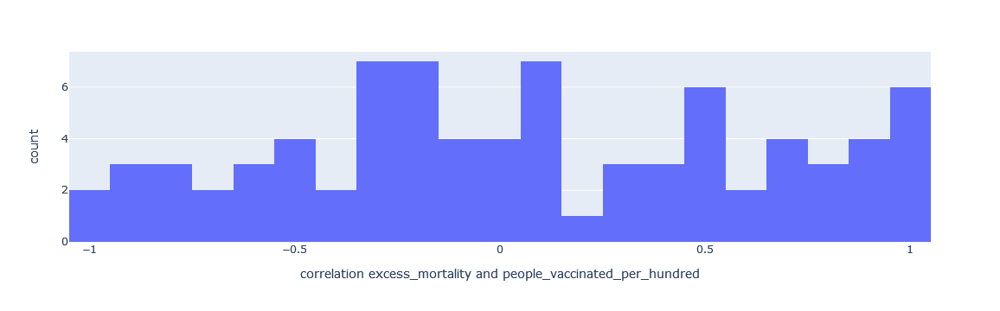

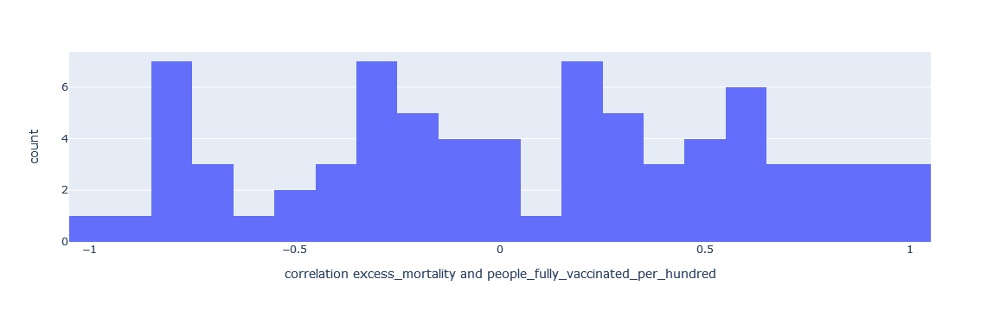

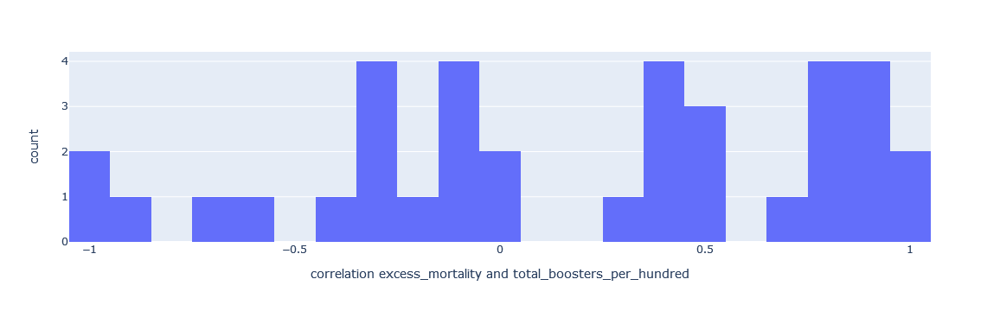

In [87]:
#pd.set_option('display.max_rows', None)
for metric in ['total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',]:
    country_corr=d.groupby('iso_code')[['excess_mortality', metric]].corr().unstack().iloc[:,1].reset_index()
    country_corr.columns=['iso_code','correlation excess_mortality and '+metric]
    px.histogram(country_corr, x='correlation excess_mortality and '+metric, nbins=30,).show()

### It is surprising that there are so many countries with very high positive correlation of excess mortality and various vaccination metrics over time.
Overal the correlation values are all over the [-1,1] interval so it is not clear what is their relationship.

The distribution is similar for all four vaccination metrics although (as expected) the number of countries we can calculate correlation is decreasing with higher level of specificity and vaccination step.

### So let's see what countries are in the dataset and what are actual correlation values?
Lets look at **total_vaccinations_per_hundred** because it has the most data available as we saw in above in dataframe describe() results.

In [88]:
pd.set_option('display.max_rows', None)
country_corr=d.groupby('iso_code')[['excess_mortality','total_vaccinations_per_hundred']].corr().unstack().iloc[:,1].reset_index()
country_corr.columns=['iso_code','correlation excess_mortality and total_vaccinations_per_hundred']
df_cntry_corr=country_corr[~country_corr['correlation excess_mortality and total_vaccinations_per_hundred'].isna()].sort_values(
        'correlation excess_mortality and total_vaccinations_per_hundred',ascending=False
    )
df_cntry_corr

,iso_code,correlation excess_mortality and total_vaccinations_per_hundred
8,ARM,1.000000
152,OMN,1.000000
81,GRL,1.000000
225,UZB,0.999957
82,GTM,0.965872
160,OWID_KOS,0.965482
182,RUS,0.938034
148,NOR,0.895113
140,MYS,0.862806
54,DNK,0.860452


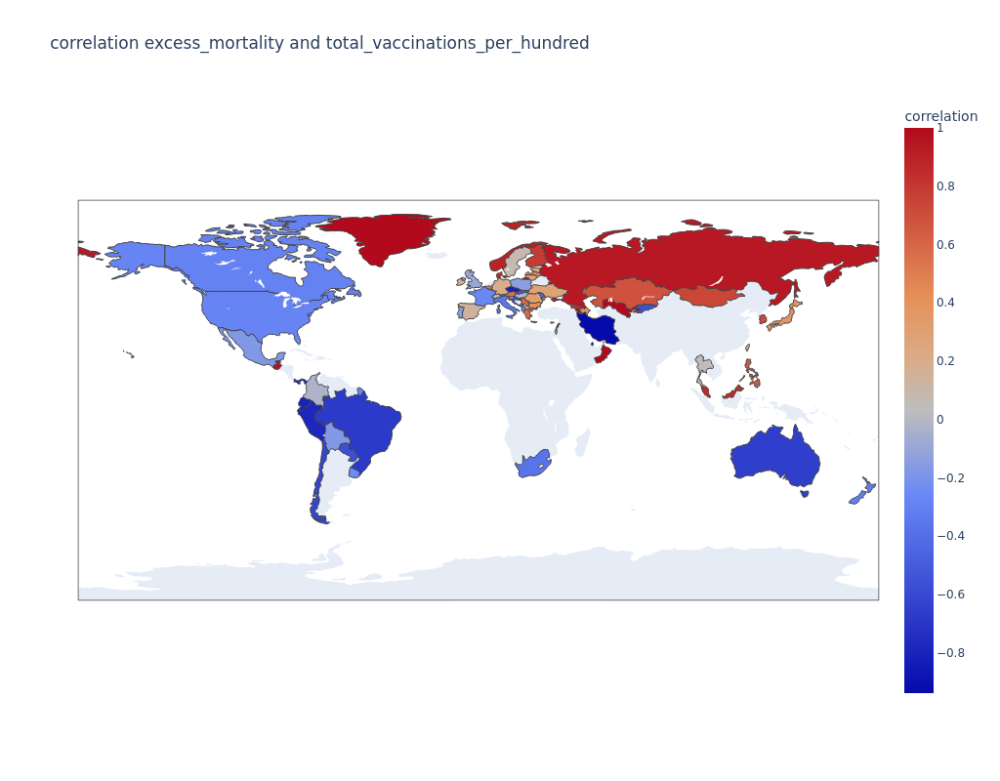

In [89]:
fig = go.Figure(data=go.Choropleth(
    locationmode = 'ISO-3',
    locations = df_cntry_corr['iso_code'],
    z = df_cntry_corr['correlation excess_mortality and total_vaccinations_per_hundred'],
    autocolorscale=False,
    colorbar_title = 'correlation',
))

fig.update_layout(
    width=1024,
    height=800,
    title_text='correlation excess_mortality and total_vaccinations_per_hundred',
    geo=dict(
        showcoastlines=False,
    ),
    )
fig.show('png')

### Data Exploration to Exclude Meaningless Datapoints
We need to make some very basic decisions as to which countries to include into our analysis. Some do not have enough meaningful data. 

So first we only keep countries where the correlation can be calculated at all (at least some mutual data points present).

Then we exclude rows with no excess mortality data at all and visualize the data.
         

In [90]:
countries_worth_looking_at=list(
    country_corr[~country_corr['correlation excess_mortality and total_vaccinations_per_hundred'].isna()].sort_values(
        'correlation excess_mortality and total_vaccinations_per_hundred',ascending=False
    )['iso_code']
)

In [91]:
print(countries_worth_looking_at)

['ARM', 'OMN', 'GRL', 'UZB', 'GTM', 'OWID_KOS', 'RUS', 'NOR', 'MYS', 'DNK', 'GEO', 'FIN', 'SGP', 'MNG', 'KOR', 'KAZ', 'PHL', 'SRB', 'GRC', 'AUT', 'BEL', 'LVA', 'HKG', 'BGR', 'AZE', 'JPN', 'ROU', 'CYP', 'LTU', 'ABW', 'UKR', 'EST', 'DEU', 'IRL', 'LUX', 'TWN', 'ESP', 'MKD', 'CHE', 'SWE', 'ISR', 'THA', 'SVN', 'HUN', 'COL', 'GBR', 'MLT', 'PRT', 'POL', 'BOL', 'MEX', 'MAC', 'ALB', 'FRO', 'URY', 'FRA', 'USA', 'BRB', 'CAN', 'NZL', 'ITA', 'ZAF', 'MNE', 'MDA', 'LIE', 'SVK', 'HRV', 'KGZ', 'PRY', 'LBN', 'CHL', 'AUS', 'QAT', 'BRA', 'PER', 'PAN', 'SMR', 'ECU', 'CZE', 'IRN']


In [92]:
df=d[ (~d['excess_mortality'].isnull()) & (d['iso_code'].isin(countries_worth_looking_at)) ]

What we will see is that the total_vaccinations_per_hundred data is not contigious but at least it is monotonous as one should expect. It may be helpful to fill the blanks with some polinomial approximation.

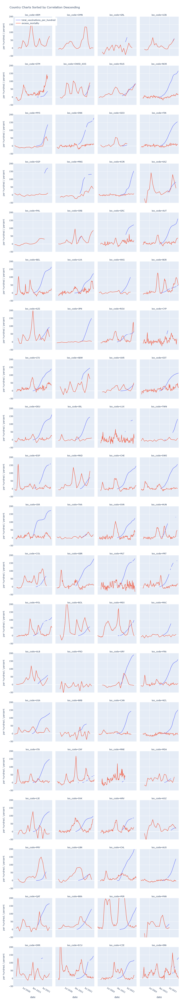

In [93]:
fig = px.line(df,    
              x='date',
              y=['total_vaccinations_per_hundred','excess_mortality'],
              facet_col='iso_code', 
              category_orders={'iso_code':countries_worth_looking_at},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "per hundred / percent",
                  "variable": "",
              },
              title="Country Charts Sorted by Correlation Descending",
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[-50, 200])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

Lets exclude ['ARM','FRO','OMN','PHL']

In [94]:
for country in ['ARM','FRO','OMN','PHL']: countries_worth_looking_at.remove(country)

In [95]:
df=d[ (~d['excess_mortality'].isnull()) & (d['iso_code'].isin(countries_worth_looking_at)) ]

As expected the data on "fully" vaccinated is less availabe and we would have to exclude 'SMR','LUX' at least. So let's stick to total_vaccinations_per_hundred, in theory every vaccination should be helpful. 

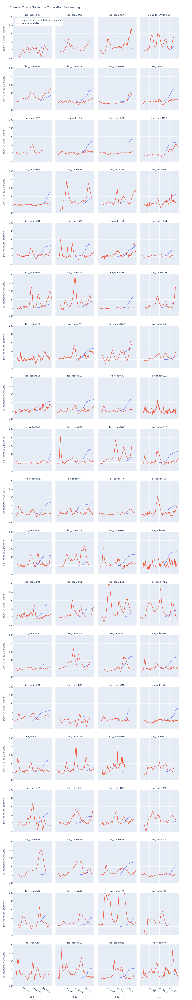

In [96]:
fig = px.line(df,    
              x='date',
              y=['people_fully_vaccinated_per_hundred','excess_mortality'],
              facet_col='iso_code', 
              category_orders={'iso_code':countries_worth_looking_at},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "per hundred / percent",
                  "variable": "",
              },
              title="Country Charts Sorted by Correlation Descending",
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[-50, 200])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

### Country Charts Sorted by Country ISO CODE 'total_vaccinations_per_hundred','excess_mortality'

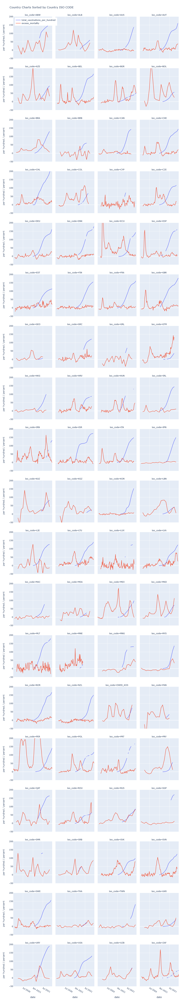

In [97]:
fig = px.line(df,    
              x='date',
              y=['total_vaccinations_per_hundred','excess_mortality'],
              facet_col='iso_code',
              category_orders={'iso_code':sorted(countries_worth_looking_at)},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "per hundred / percent",
                  "variable": "",
              },
              title="Country Charts Sorted by Country ISO CODE",
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[-50, 200])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

## Number of peaks in excess_mortality
It is not clear how to set the peak detection parameters so this is rather arbitrary.

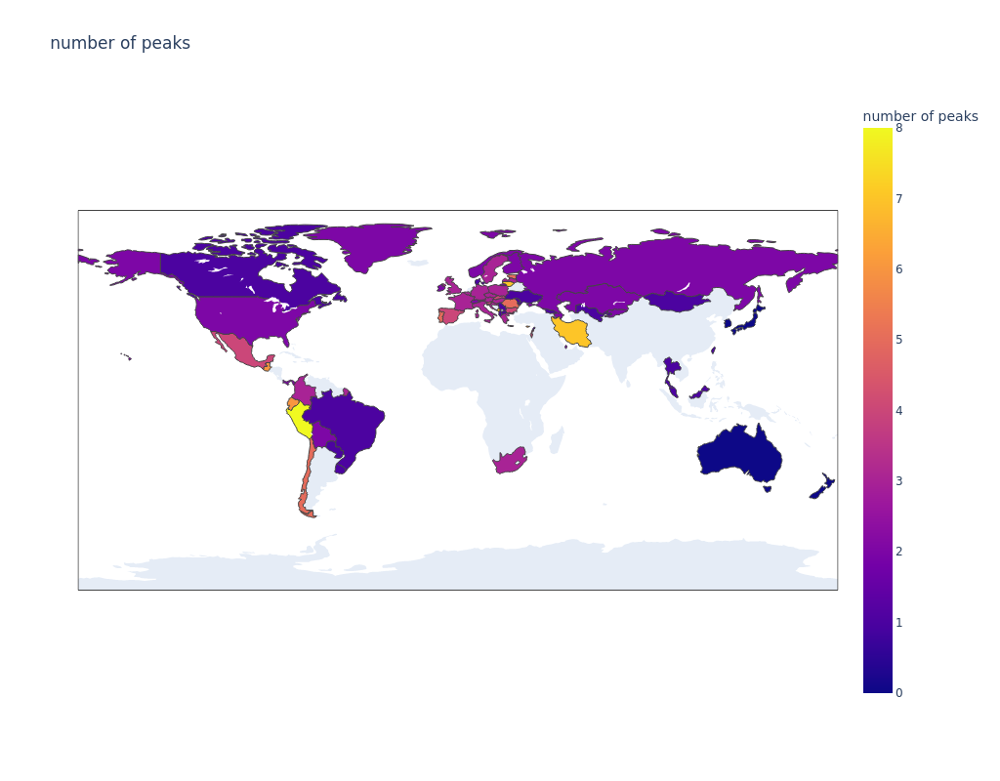

,iso_code,number of peaks
0,ABW,2
1,ALB,1
2,AUS,0
3,AUT,3
4,AZE,2
5,BEL,3
6,BGR,4
7,BOL,2
8,BRA,1
9,BRB,1


In [98]:
df_cntry_peaks = df.groupby('iso_code')['excess_mortality'].apply(lambda x: len( find_peaks(x,  height=15, threshold=1, distance=8)[0] ) ).reset_index()
df_cntry_peaks.columns=['iso_code','number of peaks']
fig = go.Figure(data=go.Choropleth(
    locationmode = 'ISO-3',
    locations = df_cntry_peaks['iso_code'],
    z = df_cntry_peaks['number of peaks'],
    #autocolorscale=False,
    colorbar_title = 'number of peaks',
))

fig.update_layout(
    width=1024,
    height=800,
    title_text='number of peaks',
    geo=dict(
        showcoastlines=False,
    ),
    )
fig.show('png')
df_cntry_peaks

## Can we see any relationship between 'aged_65_older' and 'excess_mortality'?

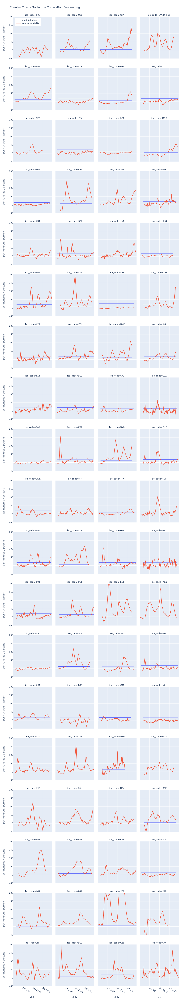

In [99]:
fig = px.line(df,    
              x='date',
              y=['aged_65_older','excess_mortality'],
              facet_col='iso_code', 
              category_orders={'iso_code':countries_worth_looking_at},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "per hundred / percent",
                  "variable": "",
              },
              title="Country Charts Sorted by Correlation Descending",
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[-50, 200])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

## What data is actually used to calculate the correllation?
Only the data points where both excess_mortality AND total_vaccinations_per_hundred is present can be used to calculate the correlation. The data looks quite different from this angle.

We re-run the same charting code but just throw away rows where d['total_vaccinations_per_hundred'].isnull().

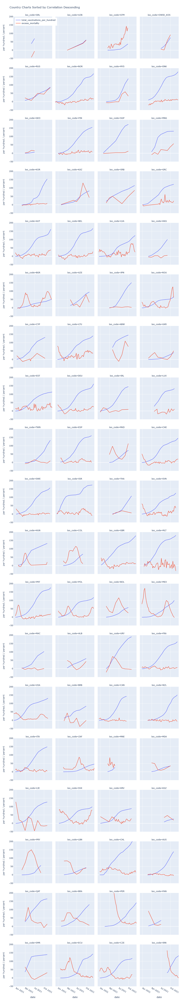

In [100]:
dfc=d[ (~d['excess_mortality'].isnull()) & (d['iso_code'].isin(countries_worth_looking_at)) & (~d['total_vaccinations_per_hundred'].isnull())]
fig = px.line(dfc,    
              x='date',
              y=['total_vaccinations_per_hundred','excess_mortality'],
              facet_col='iso_code', 
              category_orders={'iso_code':countries_worth_looking_at},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "per hundred / percent",
                  "variable": "",
              },
              title="Country Charts Sorted by Correlation Descending",              
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[-50, 200])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

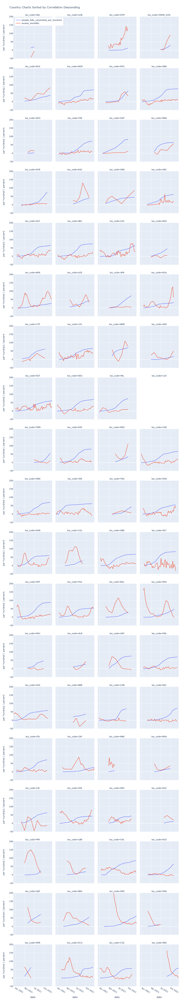

In [101]:
dfc=d[ (~d['excess_mortality'].isnull()) & (d['iso_code'].isin(countries_worth_looking_at)) & (~d['people_fully_vaccinated_per_hundred'].isnull())]
fig = px.line(dfc,    
              x='date',
              y=['people_fully_vaccinated_per_hundred','excess_mortality'],
              facet_col='iso_code', 
              category_orders={'iso_code':countries_worth_looking_at},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "per hundred / percent",
                  "variable": "",
              },
              title="Country Charts Sorted by Correlation Descending",              
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[-50, 200])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

# Cumulative Excess Mortality vs Latest Vaccination Levels
Even though we see that the relationship is far from linear let's see how the "final" values are related. We will take the cumulative data column that is more suitable for this calculation and the maximal vaccination value. To not to skew due to later values of either vaccination nor excess_mortality, let's limit dataset to the rows where both are present. As the number of vaccinations is naturally not decreasing we will use it to find the latest row.

In [102]:
df_max=d[(~d['excess_mortality_cumulative_per_million'].isnull()) & (~d['total_vaccinations_per_hundred'].isnull()
          & (d['iso_code'].isin(countries_worth_looking_at)) )
        ].loc[df.groupby(['iso_code'])['total_vaccinations_per_hundred'].idxmax()] 

## Scatter Chart 
max excess_mortality_cumulative_per_million and max total_vaccinations_per_hundred (max values per country).

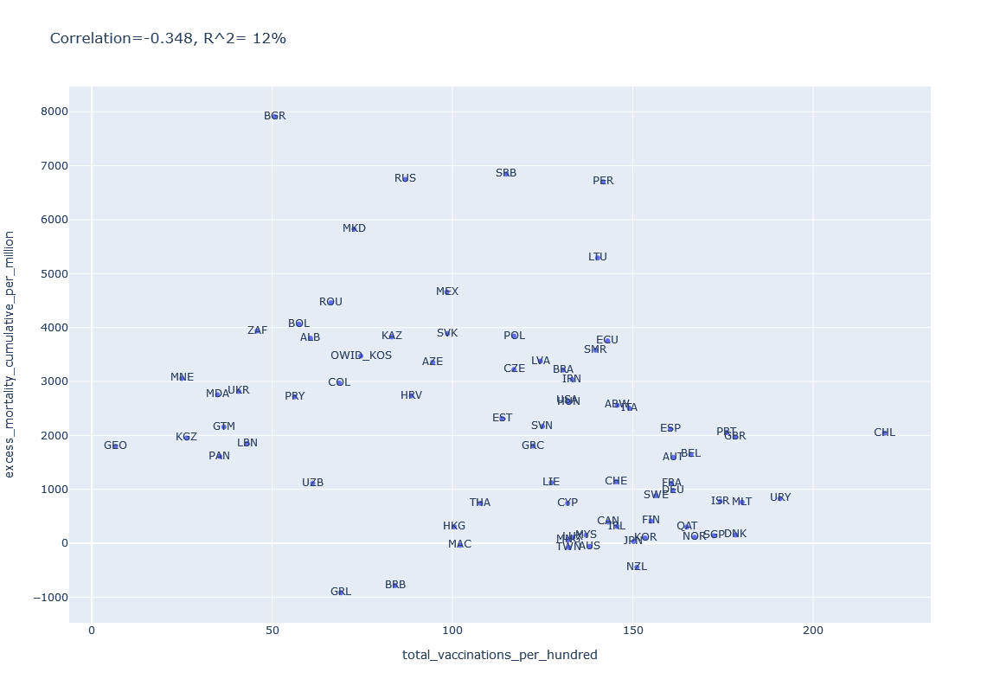

In [103]:
corr_val=df_max[['excess_mortality_cumulative_per_million','total_vaccinations_per_hundred']].corr().unstack().iloc[1]

reg = linear_model.LinearRegression()
model = reg.fit(df_max['total_vaccinations_per_hundred'].values.reshape(-1, 1), df_max['excess_mortality_cumulative_per_million'].values.reshape(-1, 1))
r2=reg.score(df_max['total_vaccinations_per_hundred'].values.reshape(-1, 1), df_max['excess_mortality_cumulative_per_million'].values.reshape(-1, 1))

fig = px.scatter(df_max,    
              x='total_vaccinations_per_hundred',
              y='excess_mortality_cumulative_per_million',
              text='iso_code',
              width=800,
              height=800,
              title="Correlation={: 1.3f}, R^2={: 1.0f}%".format(corr_val,r2*100),
             )
fig.show()

It is obvious from the chart that there is probably no linear relationship present for these two variables. The Coefficient of Determination (R^2) of 0.12 says that a linear model would explain 12% of the variance for a dependent variable.

## Choropleth maps of 'excess_mortality_cumulative_per_million' and 'total_vaccinations_per_hundred'

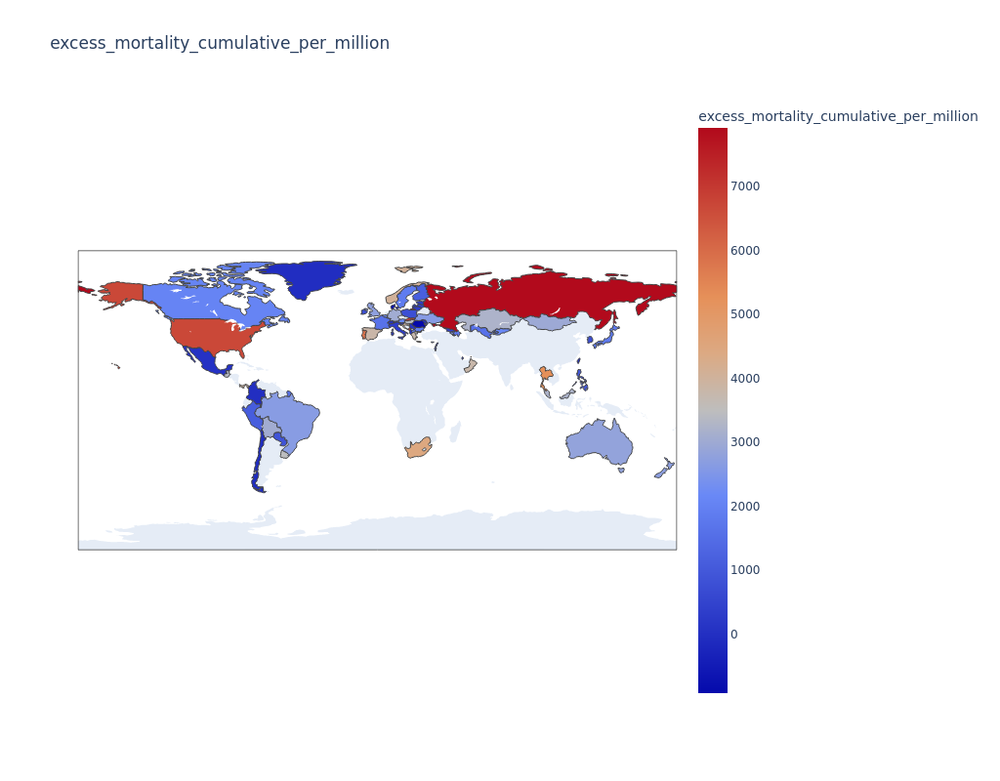

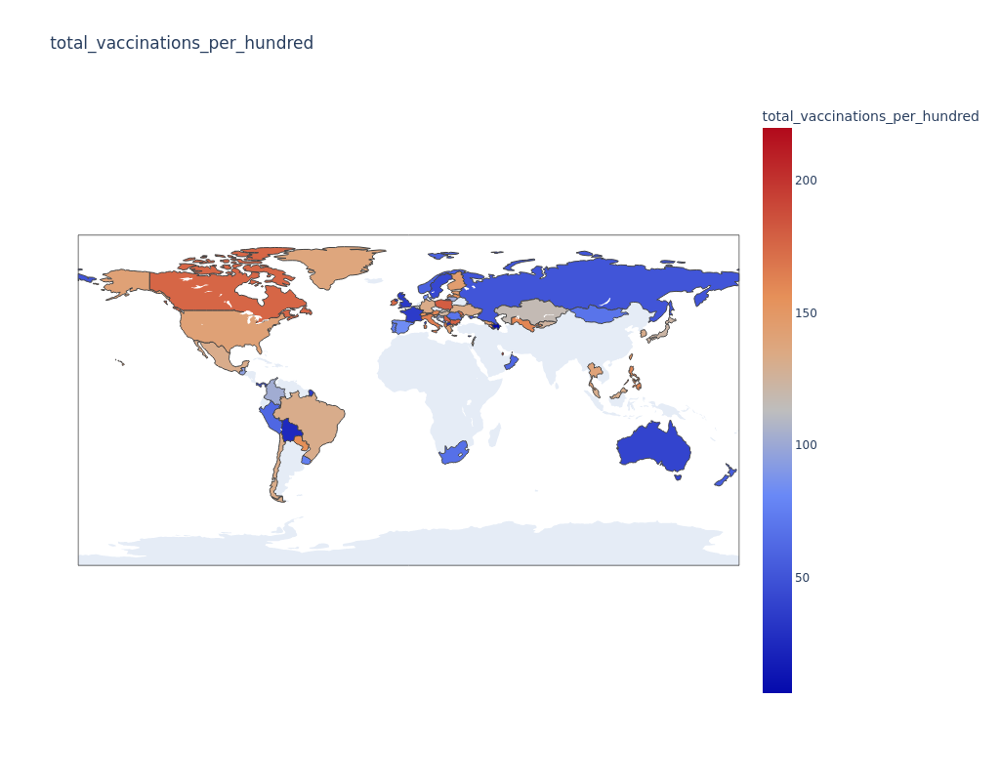

In [104]:
import plotly.graph_objects as go
for metric in ['excess_mortality_cumulative_per_million','total_vaccinations_per_hundred']:
    fig = go.Figure(data=go.Choropleth(
        locationmode = 'ISO-3',
        locations = df_cntry_corr['iso_code'],
        z = df_max[metric],
        colorbar_title = metric,
        autocolorscale=False,
    ))

    fig.update_layout(
        width=1024,
        height=800,
        title_text=metric,
        geo=dict(
            showcoastlines=False,
        ),
        )
    fig.show('png')

 ## Bubble Chart 
 country size and max excess_mortality_cumulative_per_million and max total_vaccinations_per_hundred (max values per country).

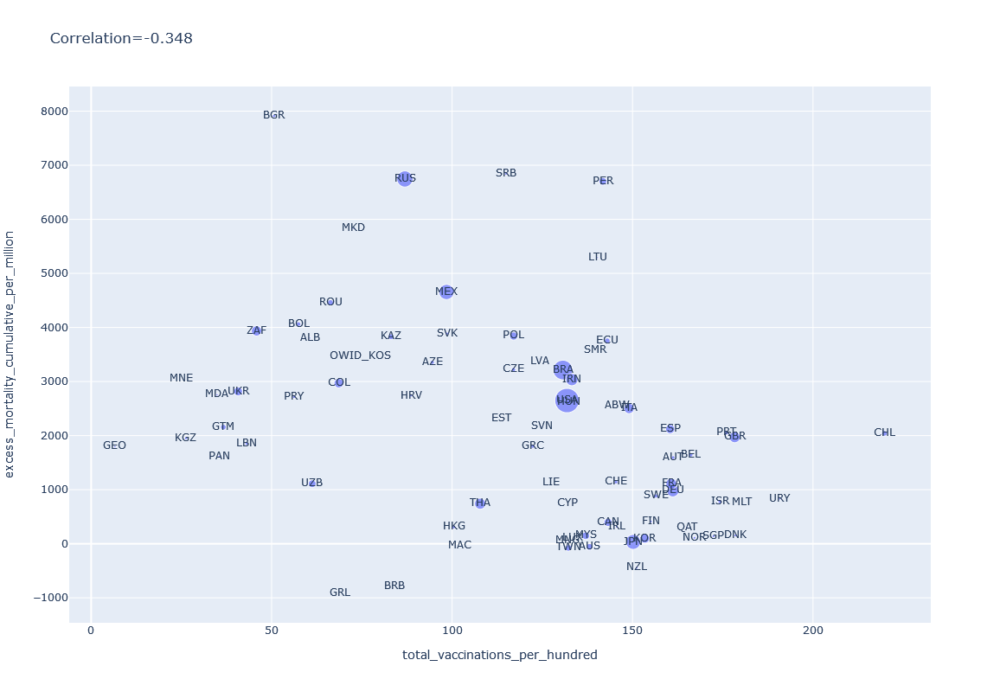

In [105]:
corr_val=df_max[['excess_mortality_cumulative_per_million','total_vaccinations_per_hundred']].corr().unstack().iloc[1]
fig = px.scatter(df_max,    
              x='total_vaccinations_per_hundred',
              y='excess_mortality_cumulative_per_million', 
              size='population',
              text='iso_code',
              width=800,
              height=800,
              title="Correlation={: 1.3f}".format(corr_val),
             )
fig.show()

## Bubble Chart Country Size <= 10M

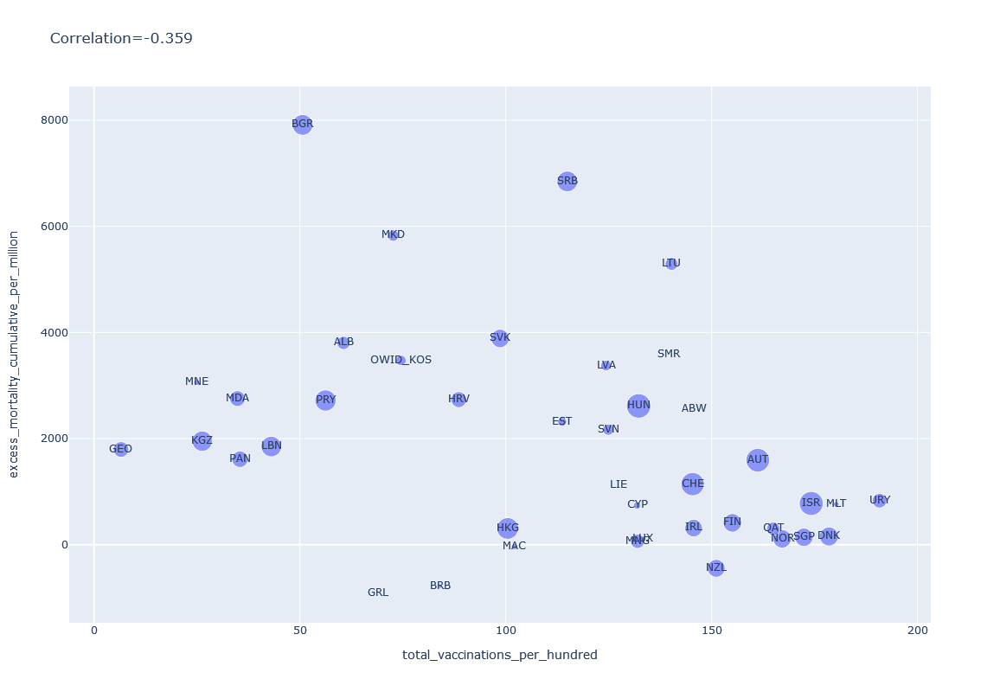

In [106]:
corr_val=df_max.loc[df_max['population']<=10000000,['excess_mortality_cumulative_per_million','total_vaccinations_per_hundred']].corr().unstack().iloc[1]
fig = px.scatter(df_max.loc[df_max['population']<=10000000],    
              x='total_vaccinations_per_hundred',
              y='excess_mortality_cumulative_per_million', 
              size='population',
              text='iso_code',
              width=800,
              height=800,
              title="Correlation={: 1.3f}".format(corr_val),
             )
fig.show()

## Bubble Chart Country Size > 10M

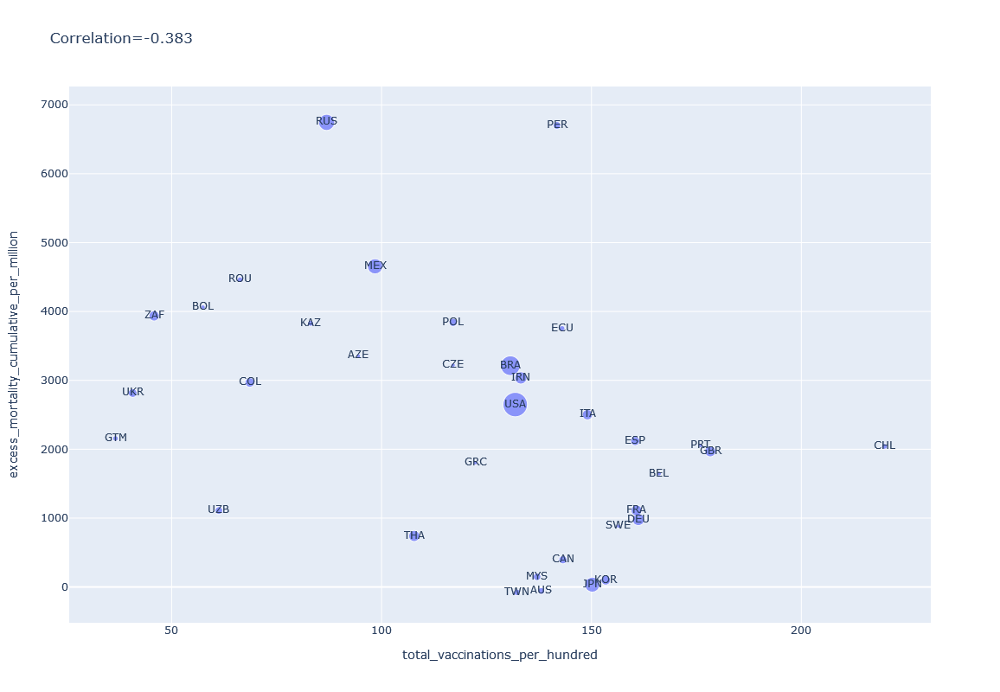

In [107]:
corr_val=df_max.loc[df_max['population']>10000000,['excess_mortality_cumulative_per_million','total_vaccinations_per_hundred']].corr().unstack().iloc[1]
fig = px.scatter(df_max.loc[df_max['population']>10000000],    
              x='total_vaccinations_per_hundred',
              y='excess_mortality_cumulative_per_million', 
              size='population',
              text='iso_code',
              width=800,
              height=800,
              title="Correlation={: 1.3f}".format(corr_val),
             )
fig.show()

# Further exploration of linear model
Let's see if we can get to a reasonable coefficient of determination using further variables from the dataset.

## Just mortality vs total vaccinations as the baseline

In [108]:
reg = linear_model.LinearRegression()
X = df_max[['total_vaccinations_per_hundred',]].fillna(df.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
print("R^2={: 1.0f}%".format(100*reg.score(X, y)))

R^2= 12%


## All population related variables AND total_vaccinations_per_hundred

In [109]:
reg = linear_model.LinearRegression()
X = df_max[['total_vaccinations_per_hundred',
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]].fillna(df.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
print("R^2={: 1.0f}%".format(100*reg.score(X, y)))

R^2= 42%


In [110]:
model.coef_

array([ 3.96103820e+00, -6.20018377e-02,  9.02253609e+01,  5.91523289e+00,
       -5.70472933e+01, -1.17123392e-02,  1.31531736e+02,  2.79932576e+00,
       -1.92206415e+01,  6.42015407e+01, -3.75714611e+00,  1.88405865e+01,
       -4.06683496e+01, -4.67225944e+01, -1.03582534e+04])

## All population related variables WITHOUT total_vaccinations_per_hundred

In [111]:
reg = linear_model.LinearRegression()
X = df_max[[
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]].fillna(df.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
print("R^2={: 1.0f}%".format(100*reg.score(X, y)))

R^2= 41%


## All population related variables AND total_vaccinations_per_hundred AND stringency_index

In [112]:
reg = linear_model.LinearRegression()
X = df_max[['total_vaccinations_per_hundred', 'stringency_index',
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]].fillna(df.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
print("R^2={: 1.0f}%".format(100*reg.score(X, y)))

R^2= 42%


## All population related variables AND stringency_index

In [113]:
reg = linear_model.LinearRegression()
X = df_max[['stringency_index',
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]].fillna(df.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
print("R^2={: 1.0f}%".format(100*reg.score(X, y)))

R^2= 41%


## All population related variables and interactions WITHOUT total_vaccinations_per_hundred

In [114]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2, interaction_only=True)
X = df_max[[
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]].fillna(df.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
Xp=poly.fit_transform(X)
reg = linear_model.LinearRegression()
model = reg.fit(Xp,y)
print("R^2={: 1.0f}%".format(100*reg.score(Xp, y)))

R^2= 100%


We seem to overfit with the added interaction terms.

## Minimal population related variables and interactions that deliver high R^2

In [115]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2, interaction_only=True)
X = df_max[[
       'aged_70_older', 'female_smokers', 'male_smokers', 
       'hospital_beds_per_thousand', 'diabetes_prevalence', 'life_expectancy',
       ]].fillna(df.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
Xp=poly.fit_transform(X)
reg = linear_model.LinearRegression()
model = reg.fit(Xp,y)
print("R^2={: 1.0f}%".format(100*reg.score(Xp, y)))

R^2= 64%


## Same population related variables WITHOUT total_vaccinations_per_hundred and WITHOUT interaction

In [116]:
reg = linear_model.LinearRegression()
X = df_max[[
       'aged_70_older', 'female_smokers', 'male_smokers', 
       'hospital_beds_per_thousand', 'diabetes_prevalence', 'life_expectancy',]].fillna(df.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
print("R^2={: 1.0f}%".format(100*reg.score(X, y)))

R^2= 33%


## mortality vs total vaccinations and policy

In [117]:
reg = linear_model.LinearRegression()
X = df_max[['total_vaccinations_per_hundred','stringency_index']].fillna(df.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
print("R^2={: 1.0f}%".format(100*reg.score(X, y)))

R^2= 12%


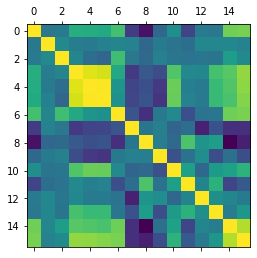

,total_vaccinations_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
total_vaccinations_per_hundred,1.000000,-0.004781,0.020768,0.370638,0.365374,0.352497,0.511358,-0.368852,-0.585209,-0.102097,0.162795,-0.316687,0.022680,-0.002912,0.641998,0.657393
stringency_index,-0.004781,1.000000,0.121249,0.040462,0.024161,0.066399,0.091929,0.074863,-0.103658,0.019598,-0.023195,-0.060861,0.110144,0.102880,0.103270,0.071236
population_density,0.020768,0.121249,1.000000,0.094919,-0.062694,-0.113651,0.491326,-0.004704,-0.086532,0.063198,-0.012503,-0.032523,-0.009655,-0.015093,0.265837,0.130657
median_age,0.370638,0.040462,0.094919,1.000000,0.918577,0.892420,0.341657,-0.384580,-0.200199,-0.271201,0.547387,0.120439,0.109170,0.517260,0.567798,0.730675
aged_65_older,0.365374,0.024161,-0.062694,0.918577,1.000000,0.987108,0.198509,-0.316615,-0.257314,-0.386906,0.624661,0.053137,0.029625,0.463727,0.550442,0.719543
aged_70_older,0.352497,0.066399,-0.113651,0.892420,0.987108,1.000000,0.170607,-0.310872,-0.234770,-0.415974,0.610096,0.073479,0.017014,0.463984,0.520930,0.691991
gdp_per_capita,0.511358,0.091929,0.491326,0.341657,0.198509,0.170607,1.000000,-0.227400,-0.434100,0.009453,0.117782,-0.258586,-0.032676,-0.009484,0.632947,0.663529
extreme_poverty,-0.368852,0.074863,-0.004704,-0.384580,-0.316615,-0.310872,-0.227400,1.000000,-0.018949,0.061363,-0.118984,-0.066667,-0.511363,-0.244443,-0.442525,-0.441622
cardiovasc_death_rate,-0.585209,-0.103658,-0.086532,-0.200199,-0.257314,-0.234770,-0.434100,-0.018949,1.000000,0.046064,-0.089227,0.536370,0.193881,0.261082,-0.665132,-0.518046
diabetes_prevalence,-0.102097,0.019598,0.063198,-0.271201,-0.386906,-0.415974,0.009453,0.061363,0.046064,1.000000,-0.251853,-0.042102,0.152543,-0.264414,-0.049483,-0.267187


In [119]:
correlation_matrix=df_max[['total_vaccinations_per_hundred', 'stringency_index',
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]].corr()
import matplotlib.pyplot as plt
plt.matshow(correlation_matrix)
plt.show()
correlation_matrix

## Less correlated variables AND total_vaccinations_per_hundred AND stringency_index

In [136]:
reg = linear_model.LinearRegression()
X = df_max[['total_vaccinations_per_hundred', 'stringency_index',
       'population_density', 
       'aged_70_older', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'human_development_index',]].fillna(df.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
print("R^2={: 1.0f}%".format(100*reg.score(X, y)))

R^2= 40%


## Less correlated variables WITHOUT total_vaccinations_per_hundred WITHOUT stringency_index

In [137]:
reg = linear_model.LinearRegression()
X = df_max[[
       'population_density', 
       'aged_70_older', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'human_development_index',]].fillna(df.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
print("R^2={: 1.0f}%".format(100*reg.score(X, y)))

R^2= 40%


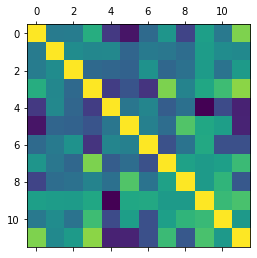

,total_vaccinations_per_hundred,stringency_index,population_density,aged_70_older,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,human_development_index
total_vaccinations_per_hundred,1.000000,0.011921,0.021315,0.362539,-0.408007,-0.593764,-0.104751,0.190373,-0.343748,0.268217,-0.002760,0.673357
stringency_index,0.011921,1.000000,0.131811,0.094671,0.098903,-0.134710,0.010022,-0.019080,-0.084328,0.248176,0.132873,0.116567
population_density,0.021315,0.131811,1.000000,-0.111638,-0.131848,-0.154689,0.173251,-0.121738,-0.054537,0.239147,-0.046577,0.232060
aged_70_older,0.362539,0.094671,-0.111638,1.000000,-0.379429,-0.248657,-0.432688,0.664551,0.068263,0.317470,0.473779,0.709368
extreme_poverty,-0.408007,0.098903,-0.131848,-0.379429,1.000000,-0.025729,0.078047,-0.187633,-0.064575,-0.686498,-0.299208,-0.527256
cardiovasc_death_rate,-0.593764,-0.134710,-0.154689,-0.248657,-0.025729,1.000000,0.048926,-0.082868,0.543010,0.318099,0.261154,-0.518187
diabetes_prevalence,-0.104751,0.010022,0.173251,-0.432688,0.078047,0.048926,1.000000,-0.271276,-0.044717,0.332248,-0.276078,-0.274903
female_smokers,0.190373,-0.019080,-0.121738,0.664551,-0.187633,-0.082868,-0.271276,1.000000,0.277754,0.231570,0.267414,0.463414
male_smokers,-0.343748,-0.084328,-0.054537,0.068263,-0.064575,0.543010,-0.044717,0.277754,1.000000,0.231312,0.414968,-0.222955
handwashing_facilities,0.268217,0.248176,0.239147,0.317470,-0.686498,0.318099,0.332248,0.231570,0.231312,1.000000,0.455505,0.514334


In [133]:
correlation_matrix=df_max[['total_vaccinations_per_hundred', 'stringency_index',
       'population_density', 
       'aged_70_older', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'human_development_index',]].corr()
import matplotlib.pyplot as plt
plt.matshow(correlation_matrix)
plt.show()
correlation_matrix